## compression1.ipynb

Field-level

In [1]:
import sys
sys.path.insert(0,'../cropseg/')

datasetinfo = { "datadir":"/home/ucfaab0/Desktop/su_african_crops_ghana/",
                "metadatadir":"/home/ucfaab0/Desktop/su_african_crops_ghana/metadata/",
                "dataset":"su_african_crops_ghana",
                "groundcollection":"su_african_crops_ghana_labels",
                "s1collection":"su_african_crops_ghana_source_s1",
                "s2collection":"su_african_crops_ghana_source_s2",
                "groundlabels":"su_african_crops_ghana_labels_id.json",
                "groundmetadata":"su_african_crops_ghana_labels.json",
                "s1metadata":"su_african_crops_ghana_source_s1.json",
                "s2metadata":"su_african_crops_ghana_source_s2.json",
                "groundname":"labels.tif",
                "s1imagename":"source.tif",
                "s2imagename":"source.tif",
                "s2maskname":"cloudmask.tif",
                "groundshape":[64,64],
                "s1shape":[64,64],
                "s2shape":[64,64],
                "extension":"tif"
              }
s1bands = [
            {"band":"vv","idx":0},
            {"band":"vh","idx":1},    
          ]  
s2bands = [
            {"band":"blue","wavelength":490,"idx":0},
            {"band":"green","wavelength":560,"idx":1},
            {"band":"red","wavelength":665,"idx":2},
            {"band":"rded1","wavelength":705,"idx":3},
            {"band":"rded2","wavelength":740,"idx":4},
            {"band":"rded3","wavelength":783,"idx":5},
            {"band":"nir","wavelength":842,"idx":6},
            {"band":"rded4","wavelength":865,"idx":7},
            {"band":"swir1","wavelength":1610,"idx":8},
            {"band":"swir2","wavelength":2190,"idx":9}
          ]
s1indices = ["vhvv"]
s2indices = ["ndvi","rdedci","ndmi"]

from mlhubdata import loadjson
groundlabels = loadjson(f'{datasetinfo["metadatadir"]}{datasetinfo["groundlabels"]}')
groundmetadata = loadjson(f'{datasetinfo["metadatadir"]}{datasetinfo["groundmetadata"]}')
s1metadata = loadjson(f'{datasetinfo["metadatadir"]}{datasetinfo["s1metadata"]}')
s2metadata = loadjson(f'{datasetinfo["metadatadir"]}{datasetinfo["s2metadata"]}')

skiplist = ["001268","002382","003146","003803"]

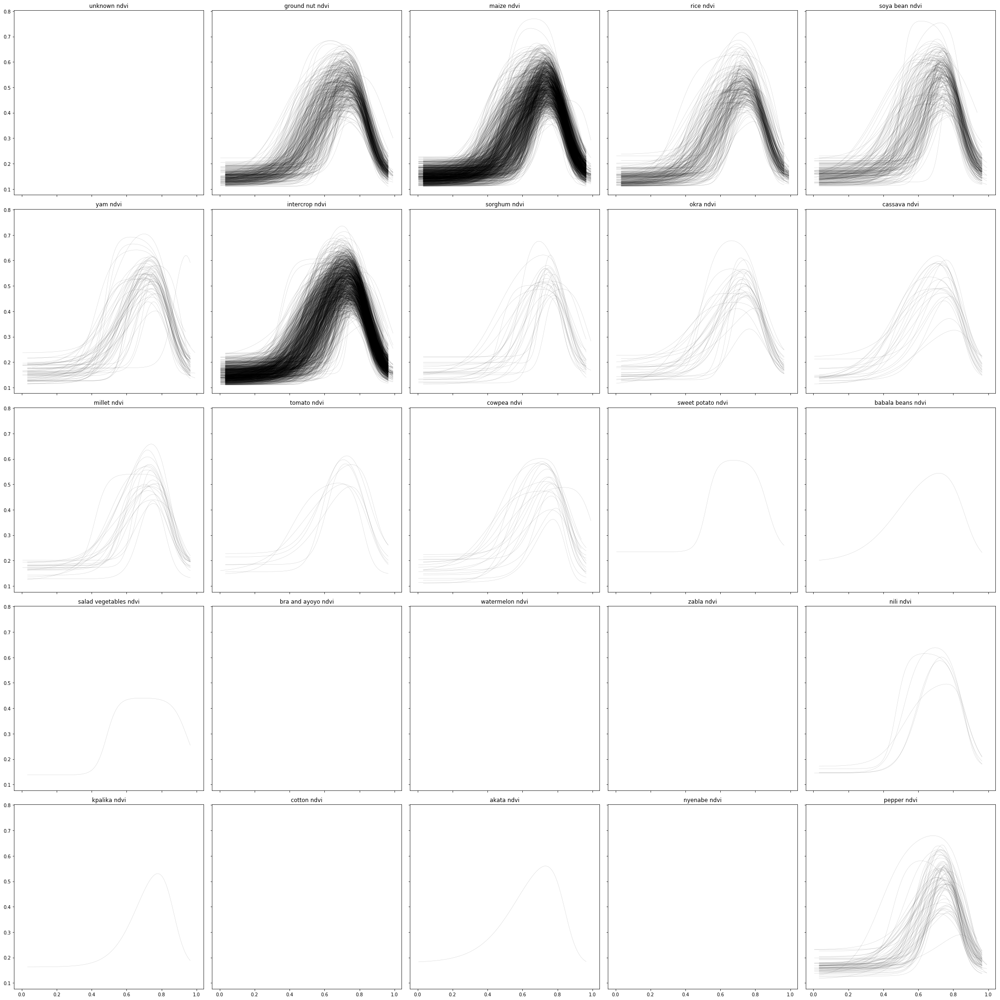

In [3]:
#####
erosioniterations = 0
index = s2indices.index("ndvi")
#####

import numpy
from osgeo import gdal
import scipy.interpolate
import matplotlib.pyplot

from grounddata import erodedfieldmasks
from mlhubdata import get_tileitems_from_collection
from satellitedata import load_satellite_data_as_array
from satellitedata import load_satellite_cloudmasks_as_array
from compression import doublelogistic
from compression import dbllogifunc
from compression import doublelogistic_fittingconditions
from compression import doublelogistic_parameterconditions
from miscellaneous import fusedataandweight
from dates import datepositions

datapos = index + len(s2bands)
s2coeffs = []
fig,ax = matplotlib.pyplot.subplots(5,5,figsize=[30,30],sharex="all",sharey="all")
axs = ax.ravel()
for i in range(len(groundmetadata)):
    tileid = groundmetadata[i]["id"].split("_")[len(groundmetadata[i]["id"].split("_"))-1]
    if tileid not in skiplist:
        tilehandle = gdal.Open(f'{datasetinfo["datadir"]}{datasetinfo["groundcollection"]}/{datasetinfo["groundcollection"]}_{tileid}/{datasetinfo["groundname"]}')
        tiledata = numpy.array(tilehandle.GetRasterBand(1).ReadAsArray(),dtype="int")
        crops = numpy.unique(tiledata[tiledata != 0])
        fieldmasks = erodedfieldmasks(tiledata,erosioniterations)
        #
        s2items,s2dates = get_tileitems_from_collection(tileid,s2metadata,datasetinfo,verbose=0)
        s2data = load_satellite_data_as_array(s2items,s2bands,s2indices,datasetinfo,datasetinfo["s2shape"],rr=4096.)
        s2cloudmasks = load_satellite_cloudmasks_as_array(s2items,datasetinfo,datasetinfo["s2shape"])
        for j in range(len(fieldmasks)):
            for k in range(fieldmasks[j][1]):
                data = []
                dates = []
                for m in range(len(s2items)):
                    fm = numpy.copy(fieldmasks[j][0])
                    cm = numpy.copy(s2cloudmasks[m])
                    fm[cm != 0] = 0                    
                    if len(s2data[m][datapos][fm == k+1]) > 0:
                        data.append(numpy.mean(s2data[m][datapos][fm == k+1]))
                        dates.append(s2dates[m])
                if len(dates) > 0:
                    data = numpy.array(data)
                    dates = numpy.array(datepositions(dates))                
                    if doublelogistic_fittingconditions(dates,data,durationmin=0.9,gapmax=0.33,amplitudemin=0.25) == True:
                        spline = scipy.interpolate.UnivariateSpline(dates,data,s=0.01,k=3)
                        splinedates = numpy.linspace(numpy.min(dates),numpy.max(dates),100)
                        fuseddates,fusedmean,fusedweights = fusedataandweight(dates,data,splinedates,spline(splinedates))                    
                        dbllog = doublelogistic(fuseddates,fusedmean,weights=fusedweights,bound=True,epsilon=0.1)
                        if doublelogistic_parameterconditions(dbllog,A1min=0.11,A1max=0.24,A2min=0.26,A2max=0.63,x01min=0.34,x01max=0.88,k1min=7.65,k1max=54.02,x02min=0.61,x02max=1.08,k2min=-43.89,k2max=-16.52) == True:
                            axs[crops[j]].plot(fuseddates,dbllogifunc(fuseddates,*dbllog),color="black",linewidth=0.5,alpha=0.2)
                            dbllog = list(dbllog)
                            dbllog.insert(0,crops[j])
                            s2coeffs.append(dbllog)         
s2coeffs = numpy.array(s2coeffs)
for i in range(len(groundlabels)):
    axs[i].set_title(f'{groundlabels[i]["crop"]} {s2indices[index]}')
matplotlib.pyplot.tight_layout()
matplotlib.pyplot.show()

/home/ucfaab0/.local/lib/python3.8/site-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


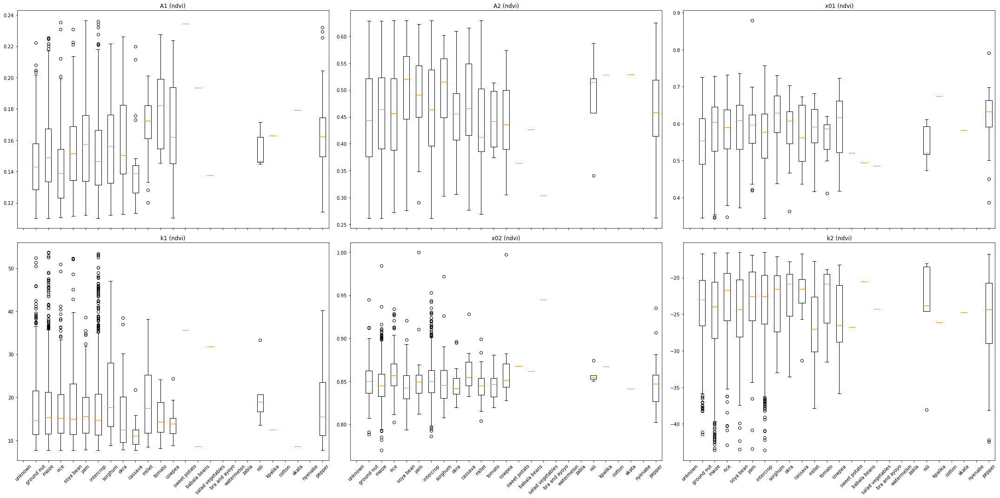

In [4]:
crops = [i["crop"] for i in groundlabels]
parameters = ["A1","A2","x01","k1","x02","k2"]
fig,ax = matplotlib.pyplot.subplots(2,3,figsize=[30,15],sharex="all")
axs = ax.ravel()
for i in range(6):
    data = []
    for j in range(len(groundlabels)):
        data.append(s2coeffs[s2coeffs[:,0] == j][:,i+1])
    axs[i].boxplot(data)
    axs[i].set_title(f'{parameters[i]} ({s2indices[index]})')
    axs[i].set_xticklabels(crops,rotation=45)
matplotlib.pyplot.tight_layout()
matplotlib.pyplot.show()

PC  stddev varprop
PC1 1.3506 0.3040
PC2 1.2262 0.2506
PC3 0.9791 0.1598
PC4 0.8807 0.1293
PC5 0.7489 0.0935
PC6 0.6142 0.0629


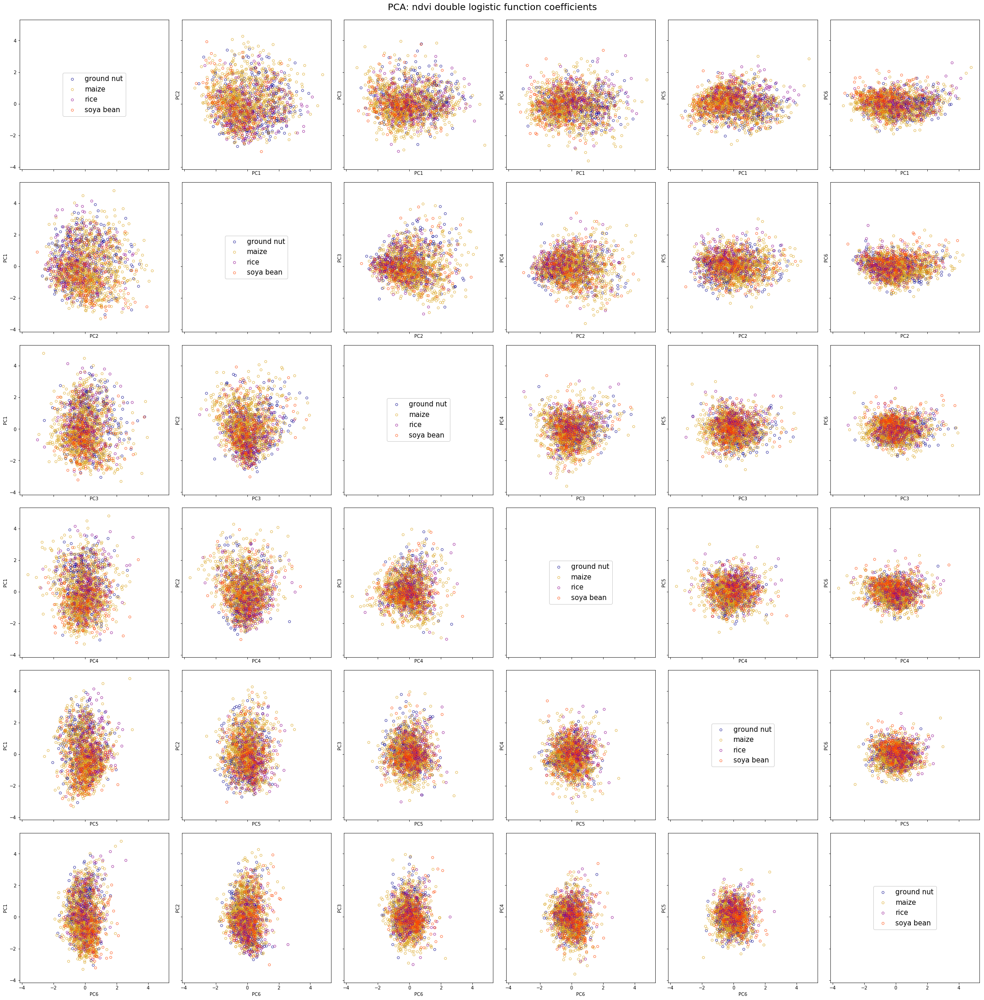

In [5]:
import sklearn.preprocessing
import sklearn.decomposition
from PIL import ImageColor

y = s2coeffs[:,0]
X = s2coeffs[:,1:]
X = sklearn.preprocessing.scale(X)
pca = sklearn.decomposition.PCA().fit(X)
X_pca = pca.transform(X)
varprop = pca.explained_variance_ratio_
stddev = numpy.std(X_pca,axis=0)
print("PC"," stddev", "varprop")
for i in range(len(varprop)):
    print(f"PC{i+1}","{:.4f}".format(stddev[i]),"{:.4f}".format(varprop[i]))
crops = numpy.unique(numpy.array(y,dtype="int"))
crops = crops[:4]
fig,ax = matplotlib.pyplot.subplots(numpy.shape(X)[1],numpy.shape(X)[1],figsize=[30,30],sharex="all",sharey="all")
axs = ax.ravel()
idx = 0
for i in range(numpy.shape(X)[1]):
    for j in range(numpy.shape(X)[1]):
        if i == j:
            for k in range(len(crops)):
                axs[idx].scatter(0,0,edgecolors=groundlabels[crops[k]]["colour"],facecolors="None",s=25,alpha=0.75,label=f'{groundlabels[crops[k]]["crop"]}',zorder=-10)
            axs[idx].legend(loc="center",fontsize=15,framealpha=1)
        if i != j:
            axs[idx].set_xlabel(f"PC{i+1}")
            axs[idx].set_ylabel(f"PC{j+1}")
            for k in range(len(crops)):
                axs[idx].scatter(X_pca[:,i][y==crops[k]],X_pca[:,j][y==crops[k]],edgecolors=groundlabels[crops[k]]["colour"],facecolors="None",s=25,alpha=0.75)
        idx = idx + 1
matplotlib.pyplot.suptitle(f'PCA: {s2indices[index]} double logistic function coefficients',y=1.01,fontsize=20)
matplotlib.pyplot.tight_layout()
matplotlib.pyplot.show()

../cropseg/satellitedata.py:17: RuntimeWarning: invalid value encountered in true_divide
  return (data[nir] - data[red]) / (data[nir] + data[red])
../cropseg/satellitedata.py:29: RuntimeWarning: invalid value encountered in true_divide
  return (data[nir] / data[reded1]) - 1
../cropseg/satellitedata.py:33: RuntimeWarning: invalid value encountered in true_divide
  return (data[nir] - data[swir1]) / (data[nir] + data[swir1])
../cropseg/satellitedata.py:29: RuntimeWarning: divide by zero encountered in true_divide
  return (data[nir] / data[reded1]) - 1
../cropseg/compression.py:15: RuntimeWarning: overflow encountered in exp
  return A1+A2*(1./(1+numpy.exp(-k1*(x-x01)))-1./(1+numpy.exp(k2*(x-x02))))


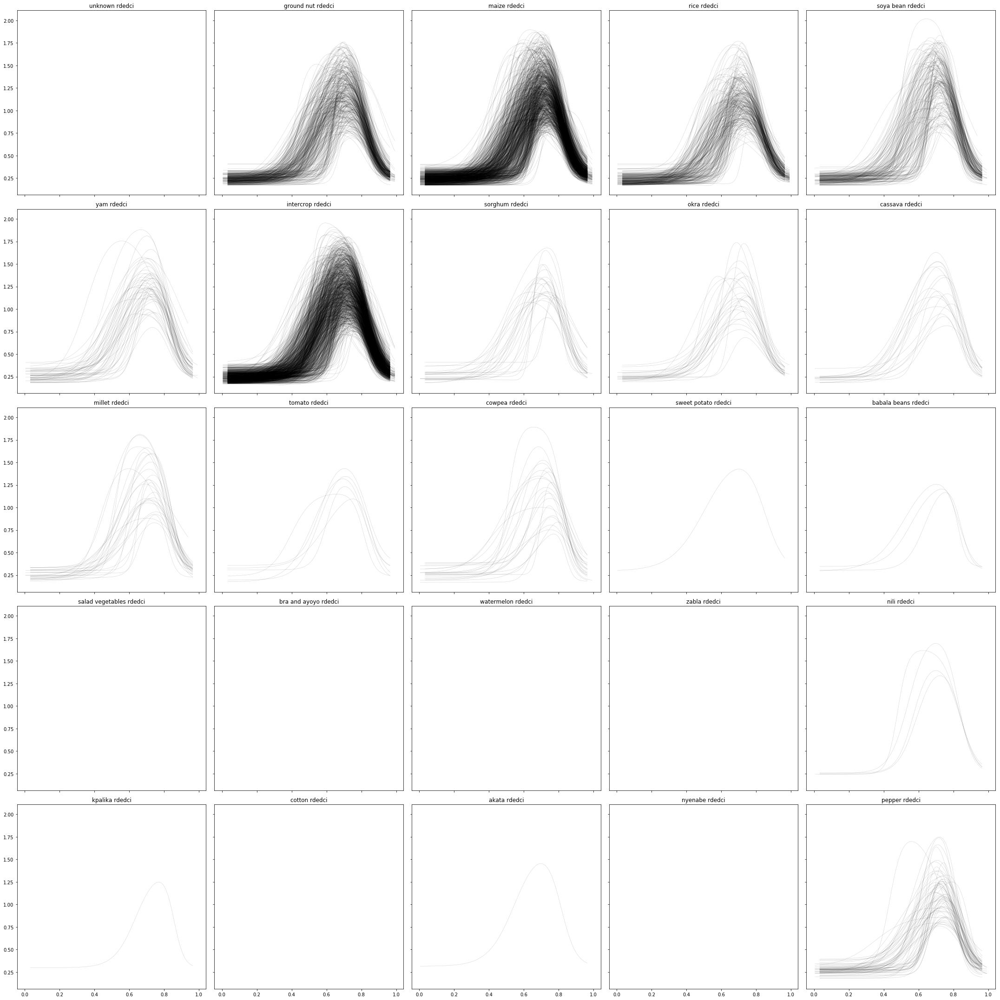

In [6]:
#####
erosioniterations = 0
index = s2indices.index("rdedci")
#####

datapos = index + len(s2bands)
s2coeffs = []
fig,ax = matplotlib.pyplot.subplots(5,5,figsize=[30,30],sharex="all",sharey="all")
axs = ax.ravel()
for i in range(len(groundmetadata)):
    tileid = groundmetadata[i]["id"].split("_")[len(groundmetadata[i]["id"].split("_"))-1]
    if tileid not in skiplist:
        tilehandle = gdal.Open(f'{datasetinfo["datadir"]}{datasetinfo["groundcollection"]}/{datasetinfo["groundcollection"]}_{tileid}/{datasetinfo["groundname"]}')
        tiledata = numpy.array(tilehandle.GetRasterBand(1).ReadAsArray(),dtype="int")
        crops = numpy.unique(tiledata[tiledata != 0])
        fieldmasks = erodedfieldmasks(tiledata,erosioniterations)
        #
        s2items,s2dates = get_tileitems_from_collection(tileid,s2metadata,datasetinfo,verbose=0)
        s2data = load_satellite_data_as_array(s2items,s2bands,s2indices,datasetinfo,datasetinfo["s2shape"],rr=4096.)
        s2cloudmasks = load_satellite_cloudmasks_as_array(s2items,datasetinfo,datasetinfo["s2shape"])
        for j in range(len(fieldmasks)):
            for k in range(fieldmasks[j][1]):
                data = []
                dates = []
                for m in range(len(s2items)):
                    fm = numpy.copy(fieldmasks[j][0])
                    cm = numpy.copy(s2cloudmasks[m])
                    fm[cm != 0] = 0                    
                    if len(s2data[m][datapos][fm == k+1]) > 0:
                        data.append(numpy.mean(s2data[m][datapos][fm == k+1]))
                        dates.append(s2dates[m])
                if len(dates) > 0:
                    data = numpy.array(data)
                    dates = numpy.array(datepositions(dates))                
                    if doublelogistic_fittingconditions(dates,data,durationmin=0.9,gapmax=0.33,amplitudemin=0.5) == True:
                        spline = scipy.interpolate.UnivariateSpline(dates,data,s=0.01,k=3)
                        splinedates = numpy.linspace(numpy.min(dates),numpy.max(dates),100)
                        fuseddates,fusedmean,fusedweights = fusedataandweight(dates,data,splinedates,spline(splinedates))                    
                        dbllog = doublelogistic(fuseddates,fusedmean,weights=fusedweights,bound=True,epsilon=0.1)
                        if doublelogistic_parameterconditions(dbllog,A1min=0.17,A1max=0.41,A2min=0.52,A2max=1.80,x01min=0.34,x01max=0.86,k1min=9.73,k1max=60.25,x02min=0.59,x02max=1.07,k2min=-45.27,k2max=-10.78) == True:
                            axs[crops[j]].plot(fuseddates,dbllogifunc(fuseddates,*dbllog),color="black",linewidth=0.5,alpha=0.2)
                            dbllog = list(dbllog)
                            dbllog.insert(0,crops[j])
                            s2coeffs.append(dbllog)         
s2coeffs = numpy.array(s2coeffs)
for i in range(len(groundlabels)):
    axs[i].set_title(f'{groundlabels[i]["crop"]} {s2indices[index]}')
matplotlib.pyplot.tight_layout()
matplotlib.pyplot.show()

/home/ucfaab0/.local/lib/python3.8/site-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


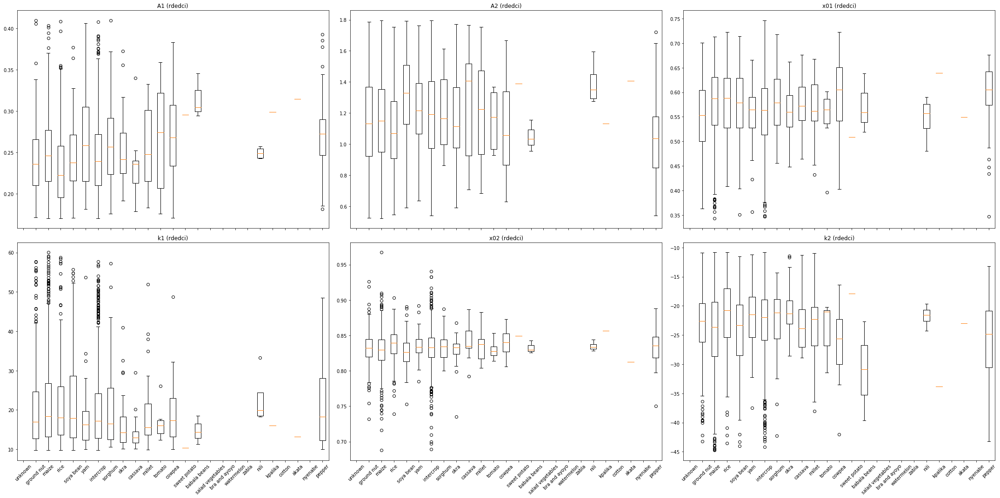

In [7]:
crops = [i["crop"] for i in groundlabels]
parameters = ["A1","A2","x01","k1","x02","k2"]

fig,ax = matplotlib.pyplot.subplots(2,3,figsize=[30,15],sharex="all")
axs = ax.ravel()

for i in range(6):
    data = []
    for j in range(len(groundlabels)):
        data.append(s2coeffs[s2coeffs[:,0] == j][:,i+1])
    axs[i].boxplot(data)
    axs[i].set_title(f'{parameters[i]} ({s2indices[index]})')
    axs[i].set_xticklabels(crops,rotation=45)
matplotlib.pyplot.tight_layout()
matplotlib.pyplot.show()

PC  stddev varprop
PC1 1.3100 0.2860
PC2 1.2401 0.2563
PC3 0.9574 0.1528
PC4 0.8667 0.1252
PC5 0.8211 0.1124
PC6 0.6357 0.0674


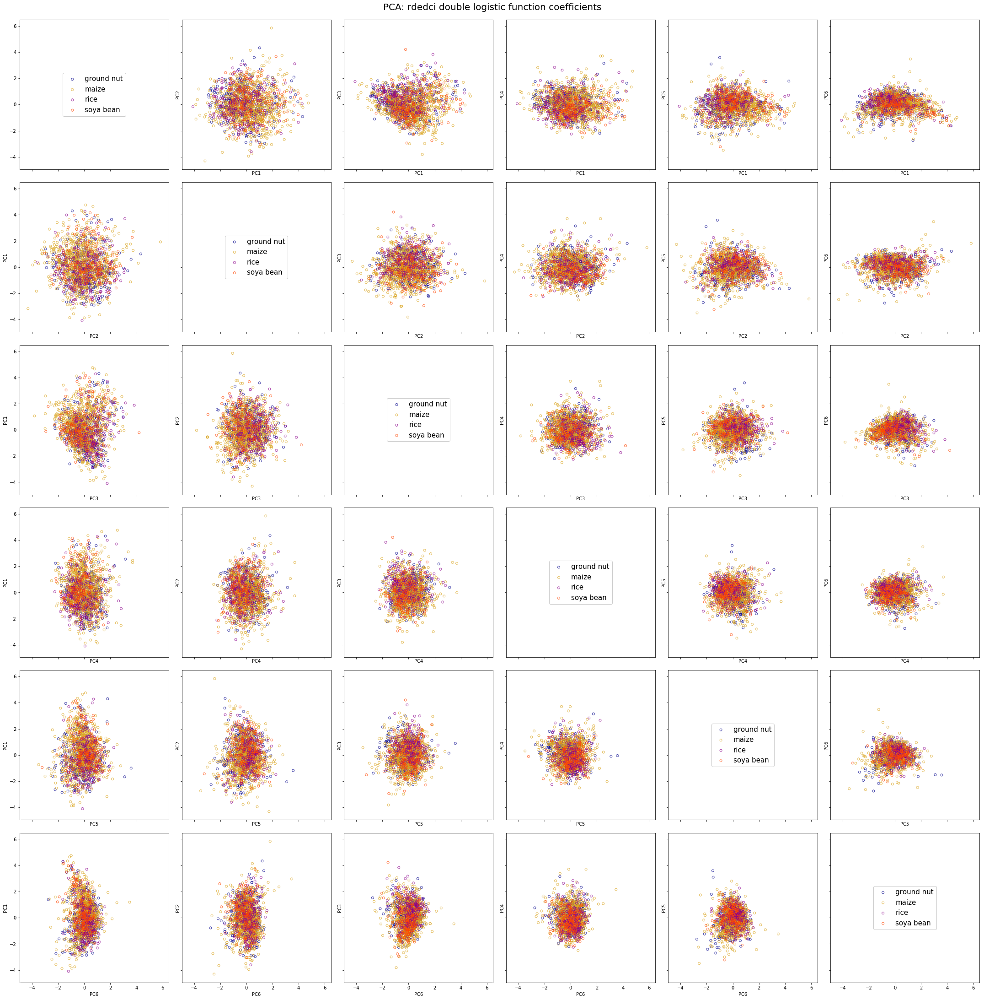

In [8]:
y = s2coeffs[:,0]
X = s2coeffs[:,1:]
X = sklearn.preprocessing.scale(X)
pca = sklearn.decomposition.PCA().fit(X)
X_pca = pca.transform(X)
varprop = pca.explained_variance_ratio_
stddev = numpy.std(X_pca,axis=0)
print("PC"," stddev", "varprop")
for i in range(len(varprop)):
    print(f"PC{i+1}","{:.4f}".format(stddev[i]),"{:.4f}".format(varprop[i]))
crops = numpy.unique(numpy.array(y,dtype="int"))
crops = crops[:4]
fig,ax = matplotlib.pyplot.subplots(numpy.shape(X)[1],numpy.shape(X)[1],figsize=[30,30],sharex="all",sharey="all")
axs = ax.ravel()
idx = 0
for i in range(numpy.shape(X)[1]):
    for j in range(numpy.shape(X)[1]):
        if i == j:
            for k in range(len(crops)):
                axs[idx].scatter(0,0,edgecolors=groundlabels[crops[k]]["colour"],facecolors="None",s=25,alpha=0.75,label=f'{groundlabels[crops[k]]["crop"]}',zorder=-10)
            axs[idx].legend(loc="center",fontsize=15,framealpha=1)
        if i != j:
            axs[idx].set_xlabel(f"PC{i+1}")
            axs[idx].set_ylabel(f"PC{j+1}")
            for k in range(len(crops)):
                axs[idx].scatter(X_pca[:,i][y==crops[k]],X_pca[:,j][y==crops[k]],edgecolors=groundlabels[crops[k]]["colour"],facecolors="None",s=25,alpha=0.75)
        idx = idx + 1
matplotlib.pyplot.suptitle(f'PCA: {s2indices[index]} double logistic function coefficients',y=1.01,fontsize=20)
matplotlib.pyplot.tight_layout()
matplotlib.pyplot.show()

../cropseg/satellitedata.py:17: RuntimeWarning: invalid value encountered in true_divide
  return (data[nir] - data[red]) / (data[nir] + data[red])
../cropseg/satellitedata.py:29: RuntimeWarning: invalid value encountered in true_divide
  return (data[nir] / data[reded1]) - 1
../cropseg/satellitedata.py:33: RuntimeWarning: invalid value encountered in true_divide
  return (data[nir] - data[swir1]) / (data[nir] + data[swir1])
../cropseg/satellitedata.py:29: RuntimeWarning: divide by zero encountered in true_divide
  return (data[nir] / data[reded1]) - 1


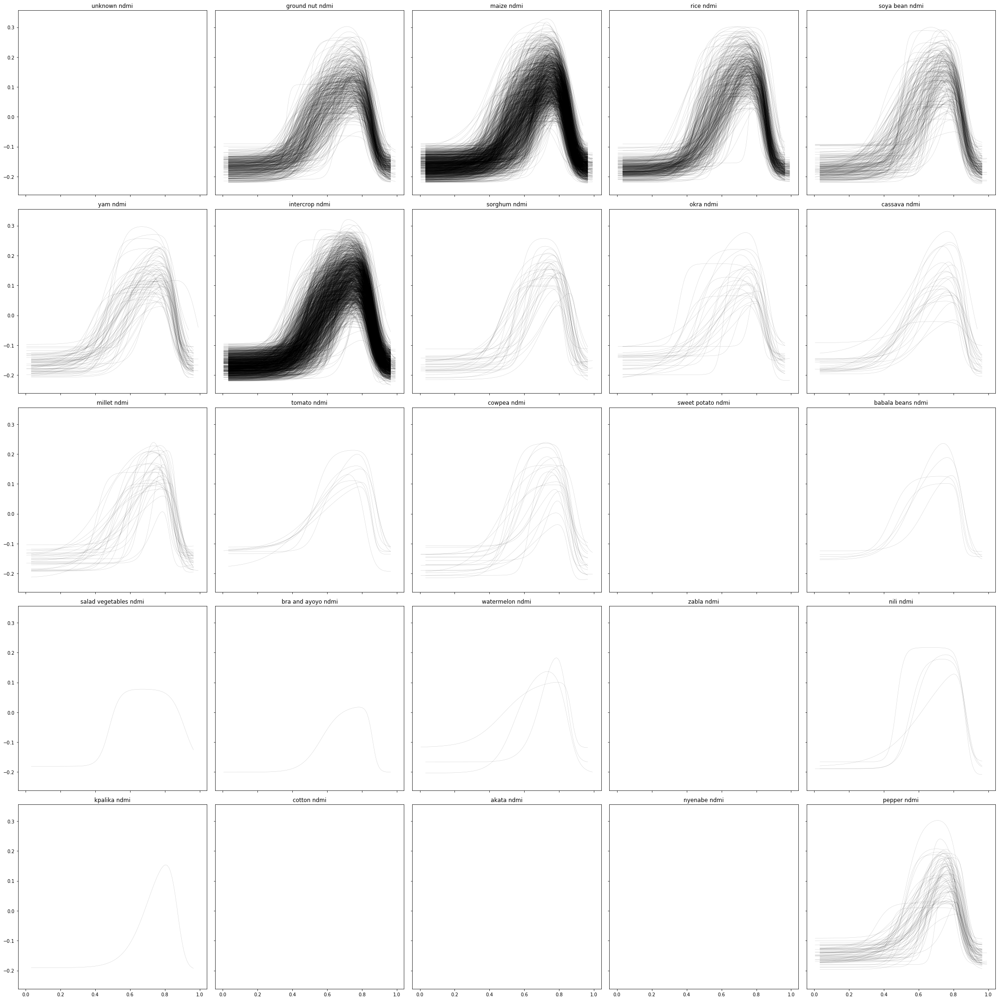

In [9]:
#####
erosioniterations = 0
index = s2indices.index("ndmi")
#####

datapos = index + len(s2bands)
s2coeffs = []
fig,ax = matplotlib.pyplot.subplots(5,5,figsize=[30,30],sharex="all",sharey="all")
axs = ax.ravel()
for i in range(len(groundmetadata)):
    tileid = groundmetadata[i]["id"].split("_")[len(groundmetadata[i]["id"].split("_"))-1]
    if tileid not in skiplist:
        tilehandle = gdal.Open(f'{datasetinfo["datadir"]}{datasetinfo["groundcollection"]}/{datasetinfo["groundcollection"]}_{tileid}/{datasetinfo["groundname"]}')
        tiledata = numpy.array(tilehandle.GetRasterBand(1).ReadAsArray(),dtype="int")
        crops = numpy.unique(tiledata[tiledata != 0])
        fieldmasks = erodedfieldmasks(tiledata,erosioniterations)
        #
        s2items,s2dates = get_tileitems_from_collection(tileid,s2metadata,datasetinfo,verbose=0)
        s2data = load_satellite_data_as_array(s2items,s2bands,s2indices,datasetinfo,datasetinfo["s2shape"],rr=4096.)
        s2cloudmasks = load_satellite_cloudmasks_as_array(s2items,datasetinfo,datasetinfo["s2shape"])
        for j in range(len(fieldmasks)):
            for k in range(fieldmasks[j][1]):
                data = []
                dates = []
                for m in range(len(s2items)):
                    fm = numpy.copy(fieldmasks[j][0])
                    cm = numpy.copy(s2cloudmasks[m])
                    fm[cm != 0] = 0                    
                    if len(s2data[m][datapos][fm == k+1]) > 0:
                        data.append(numpy.mean(s2data[m][datapos][fm == k+1]))
                        dates.append(s2dates[m])
                if len(dates) > 0:
                    data = numpy.array(data)
                    dates = numpy.array(datepositions(dates))                
                    if doublelogistic_fittingconditions(dates,data,durationmin=0.9,gapmax=0.33,amplitudemin=0.2) == True:
                        spline = scipy.interpolate.UnivariateSpline(dates,data,s=0.01,k=3)
                        splinedates = numpy.linspace(numpy.min(dates),numpy.max(dates),100)
                        fuseddates,fusedmean,fusedweights = fusedataandweight(dates,data,splinedates,spline(splinedates))                    
                        dbllog = doublelogistic(fuseddates,fusedmean,weights=fusedweights,bound=True,epsilon=0.1)
                        if doublelogistic_parameterconditions(dbllog,A1min=-0.22,A1max=-0.09,A2min=0.15,A2max=0.49,x01min=0.34,x01max=0.96,k1min=7.88,k1max=84.59,x02min=0.62,x02max=1.08,k2min=-101.88,k2max=-25.03) == True:
                            axs[crops[j]].plot(fuseddates,dbllogifunc(fuseddates,*dbllog),color="black",linewidth=0.5,alpha=0.2)
                            dbllog = list(dbllog)
                            dbllog.insert(0,crops[j])
                            s2coeffs.append(dbllog)         
s2coeffs = numpy.array(s2coeffs)
for i in range(len(groundlabels)):
    axs[i].set_title(f'{groundlabels[i]["crop"]} {s2indices[index]}')
matplotlib.pyplot.tight_layout()
matplotlib.pyplot.show()

/home/ucfaab0/.local/lib/python3.8/site-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


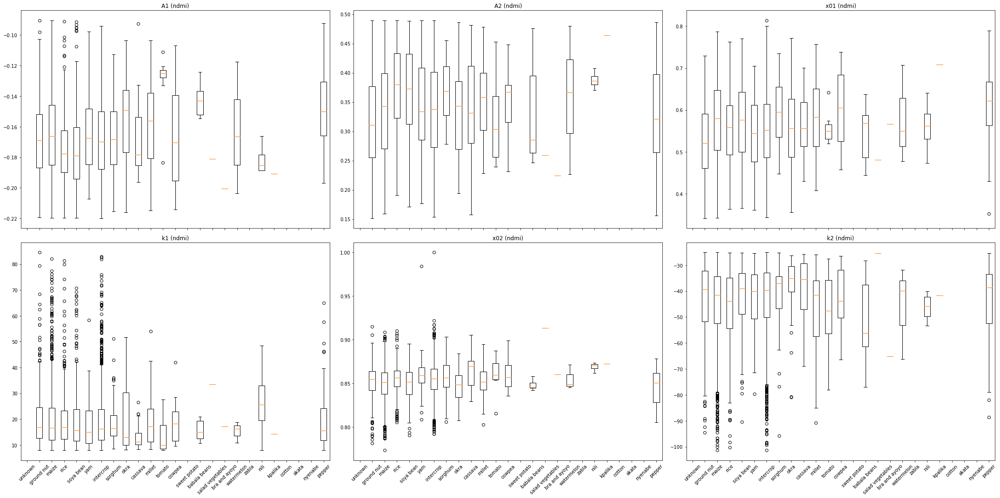

In [10]:
crops = [i["crop"] for i in groundlabels]
parameters = ["A1","A2","x01","k1","x02","k2"]

fig,ax = matplotlib.pyplot.subplots(2,3,figsize=[30,15],sharex="all")
axs = ax.ravel()

for i in range(6):
    data = []
    for j in range(len(groundlabels)):
        data.append(s2coeffs[s2coeffs[:,0] == j][:,i+1])
    axs[i].boxplot(data)
    axs[i].set_title(f'{parameters[i]} ({s2indices[index]})')
    axs[i].set_xticklabels(crops,rotation=45)
matplotlib.pyplot.tight_layout()
matplotlib.pyplot.show()

PC  stddev varprop
PC1 1.3482 0.3029
PC2 1.1499 0.2204
PC3 1.0338 0.1781
PC4 0.8535 0.1214
PC5 0.8231 0.1129
PC6 0.6209 0.0642


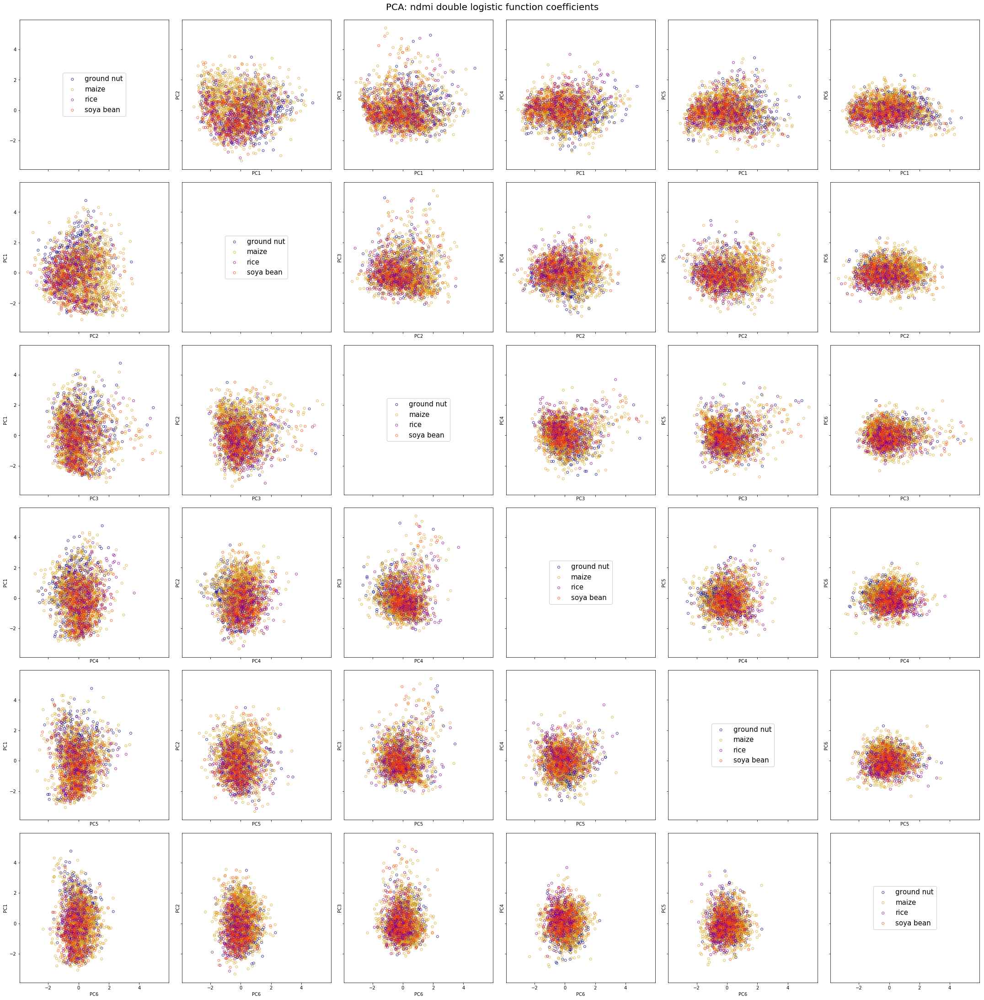

In [11]:
y = s2coeffs[:,0]
X = s2coeffs[:,1:]
X = sklearn.preprocessing.scale(X)
pca = sklearn.decomposition.PCA().fit(X)
X_pca = pca.transform(X)
varprop = pca.explained_variance_ratio_
stddev = numpy.std(X_pca,axis=0)
print("PC"," stddev", "varprop")
for i in range(len(varprop)):
    print(f"PC{i+1}","{:.4f}".format(stddev[i]),"{:.4f}".format(varprop[i]))
crops = numpy.unique(numpy.array(y,dtype="int"))
crops = crops[:4]
fig,ax = matplotlib.pyplot.subplots(numpy.shape(X)[1],numpy.shape(X)[1],figsize=[30,30],sharex="all",sharey="all")
axs = ax.ravel()
idx = 0
for i in range(numpy.shape(X)[1]):
    for j in range(numpy.shape(X)[1]):
        if i == j:
            for k in range(len(crops)):
                axs[idx].scatter(0,0,edgecolors=groundlabels[crops[k]]["colour"],facecolors="None",s=25,alpha=0.75,label=f'{groundlabels[crops[k]]["crop"]}',zorder=-10)
            axs[idx].legend(loc="center",fontsize=15,framealpha=1)
        if i != j:
            axs[idx].set_xlabel(f"PC{i+1}")
            axs[idx].set_ylabel(f"PC{j+1}")
            for k in range(len(crops)):
                axs[idx].scatter(X_pca[:,i][y==crops[k]],X_pca[:,j][y==crops[k]],edgecolors=groundlabels[crops[k]]["colour"],facecolors="None",s=25,alpha=0.75)
        idx = idx + 1
matplotlib.pyplot.suptitle(f'PCA: {s2indices[index]} double logistic function coefficients',y=1.01,fontsize=20)
matplotlib.pyplot.tight_layout()
matplotlib.pyplot.show()

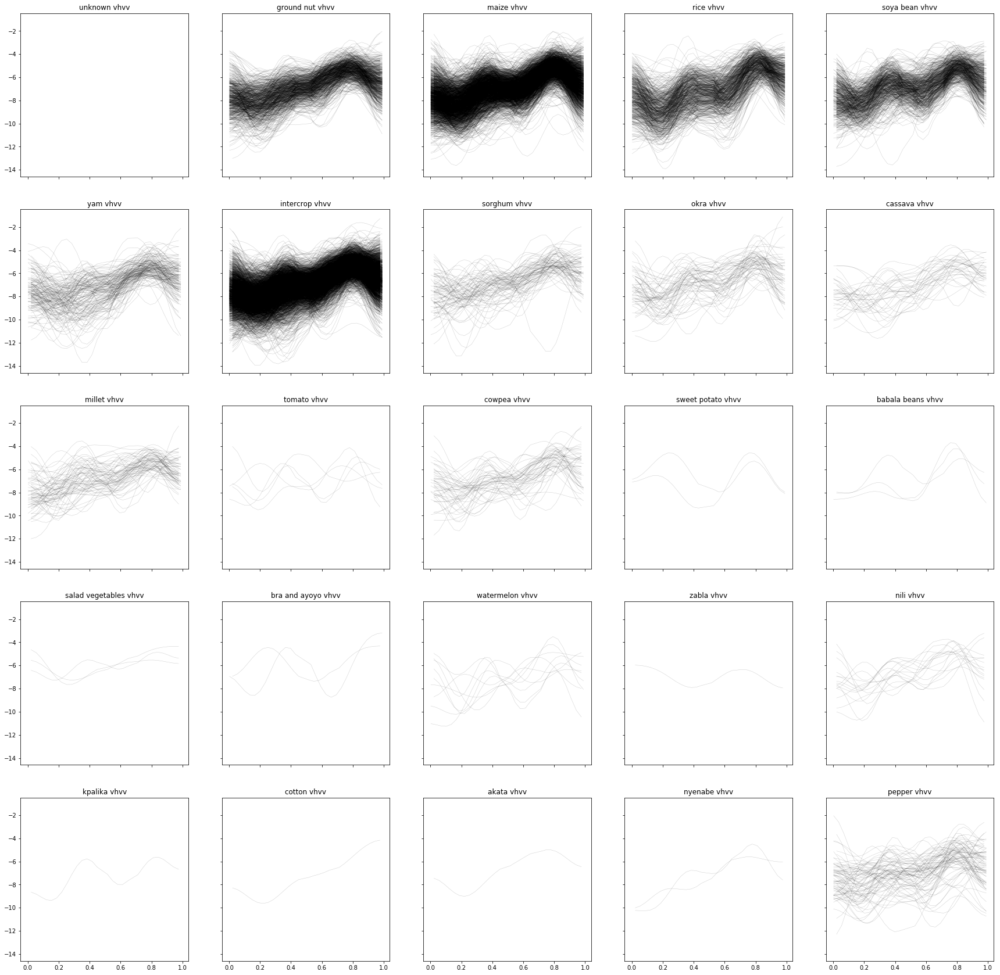

In [12]:
#####
erosioniterations = 2
index = s1indices.index("vhvv")
ncoeff = 6
#####

from compression import dct
from compression import idct
from compression import dct_fittingconditions

datapos = index + len(s1bands)

fig,ax = matplotlib.pyplot.subplots(5,5,figsize=[30,30],sharex="all",sharey="all")
axs = ax.ravel()
for i in range(len(groundmetadata)):
    tileid = groundmetadata[i]["id"].split("_")[len(groundmetadata[i]["id"].split("_"))-1]
    if tileid not in skiplist:
        tilehandle = gdal.Open(f'{datasetinfo["datadir"]}{datasetinfo["groundcollection"]}/{datasetinfo["groundcollection"]}_{tileid}/{datasetinfo["groundname"]}')
        tiledata = numpy.array(tilehandle.GetRasterBand(1).ReadAsArray(),dtype="int")
        crops = numpy.unique(tiledata[tiledata != 0])
        fieldmasks = erodedfieldmasks(tiledata,erosioniterations)
        #
        s1items,s1dates = get_tileitems_from_collection(tileid,s1metadata,datasetinfo,verbose=0)
        s1data = load_satellite_data_as_array(s1items,s1bands,s1indices,datasetinfo,datasetinfo["s1shape"])
        #
        for j in range(len(fieldmasks)):
            for k in range(fieldmasks[j][1]):
                data = []
                dates = []
                for m in range(len(s1items)):
                    fm = numpy.copy(fieldmasks[j][0])
                    if len(s1data[m][datapos][fm == k+1]) > 0:
                        data.append(numpy.mean(s1data[m][datapos][fm == k+1]))
                        dates.append(s1dates[m])
                if len(data) > 0:
                    data = numpy.array(data)
                    dpos = numpy.array(datepositions(dates))                
                    if numpy.isnan(numpy.sum(data)) == False and numpy.min(data) > -15.0 and numpy.max(data) < 0.0:
                        if dct_fittingconditions(dpos,data,minduration=0.9,maxgap=0.33) == True:
                            dctcoeff = dct(data,len(data))
                            inverse = idct(dctcoeff,ncoeff)    
                            axs[crops[j]].plot(dpos,inverse,color="black",linewidth=0.5,alpha=0.2)
for i in range(len(groundlabels)):
    axs[i].set_title(f'{groundlabels[i]["crop"]} {s1indices[index]}')
matplotlib.pyplot.show()